## Actividad Semanal -- 4 Dimensionality Reduction and Normalization
### Equipo 30
### - A01793999 - Nathalia Prada
### - A01793933 - Christian Suárez Gil

________________________________

Importación de librerías

In [1]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import plotly.io as pio
pio.templates.default = "plotly_white"
import plotly.express as px
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
import seaborn as sns
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns

# Propósito de la actividad



Esta actividad está orientada a implementar el análisis de componentes principales como estrategia para reducir, sin perder demasiada información, la dimensionalidad de nuestro conjunto de datos. Esto es realmente importante, porque el proceso de entrenamiento de modelos de aprendizaje automático puede requerir muchos recursos computacionales y requiere mucho más para cada variable adicional que tiene nuestro conjunto de datos. Por otro lado, algunos modelos, como los modelos de regresión, no funcionarán correctamente si nuestras características están correlacionadas porque esta técnica exige que los predictores sean independientes y no estén correlacionados.



### Lectura de Datos

In [2]:
Path = 'https://raw.githubusercontent.com/PosgradoMNA/Actividades_Aprendizaje-/main/default%20of%20credit%20card%20clients.csv'

Se leen los datos y se cambia el nombre de las columnas por nombres más descriptivos para facilitar el análisis.

In [3]:
credit_df = pd.read_csv(Path, index_col = 0)
credit_df.rename(columns = {'X1' : 'credit', 'X2': 'gender', 'X3': 'education', 'X4': 'marital', 'X5': 'age',
                      'X6' : 'hpp Sep 2005', 'X7' : 'hpp Aug 2005', 'X8' : 'hpp Jul 2005', 'X9' : 'hpp Jun 2005', 'X10' : 'hpp May 2005', 'X11' : 'hpp Apr 2005', 
                      'X12' : 'abs Sep 2005', 'X13' : 'abs Aug 2005', 'X14' : 'abs Jul 2005', 'X15' : 'abs Jun 2005', 'X16' : 'abs May 2005', 'X17' : 'abs Apr 2005', 
                      'X18' : 'app Sep 2005', 'X19' : 'app Aug 2005', 'X20' : 'app Jul 2005', 'X21' : 'app Jun 2005', 'X22' : 'app May 2005', 'X23' : 'app Apr 2005', 'Y':'Y credibility'}, inplace = True)

df = credit_df.copy()
df

,credit,gender,education,marital,age,hpp Sep 2005,hpp Aug 2005,hpp Jul 2005,hpp Jun 2005,hpp May 2005,...,abs Jun 2005,abs May 2005,abs Apr 2005,app Sep 2005,app Aug 2005,app Jul 2005,app Jun 2005,app May 2005,app Apr 2005,Y credibility
ID,,,,,,,,,,,,,,,,,,,,,
1,20000,2.0,2.0,1.0,24.0,2.0,2.0,-1.0,-1.0,-2.0,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1.0
2,120000,2.0,2.0,2.0,26.0,-1.0,2.0,0.0,0.0,0.0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1.0
3,90000,2.0,2.0,2.0,34.0,0.0,0.0,0.0,0.0,0.0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0.0
4,50000,2.0,2.0,1.0,37.0,0.0,0.0,0.0,0.0,0.0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0.0
5,50000,1.0,2.0,1.0,57.0,-1.0,0.0,-1.0,0.0,0.0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29996,220000,1.0,3.0,1.0,39.0,0.0,0.0,0.0,0.0,0.0,...,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0,0.0
29997,150000,1.0,3.0,2.0,43.0,-1.0,-1.0,-1.0,-1.0,0.0,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0.0
29998,30000,1.0,2.0,2.0,37.0,4.0,3.0,2.0,-1.0,0.0,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1.0


### Matriz de Correlaciones entre variables

Se muestra una matriz con las correlaciones de la variables, para hacer un análisis inicial de la información y las posibles correlaciones entre los datos. 
   

Text(0.5, 1.0, 'Correlations between Categories')

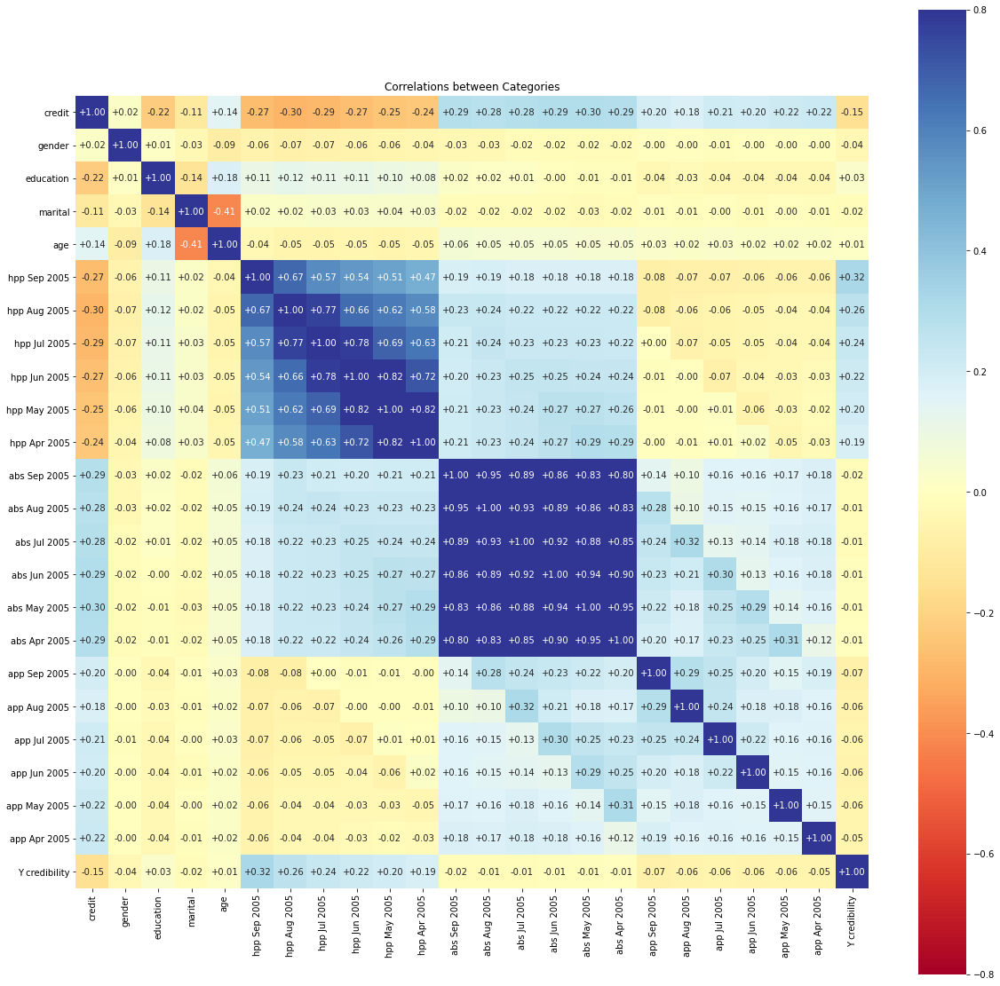

In [4]:
# subset of predictors to plot:
corrcats=['credit', 'gender', 'education', 'marital', 'age', 'hpp Sep 2005',
       'hpp Aug 2005', 'hpp Jul 2005', 'hpp Jun 2005', 'hpp May 2005',
       'hpp Apr 2005', 'abs Sep 2005', 'abs Aug 2005', 'abs Jul 2005',
       'abs Jun 2005', 'abs May 2005', 'abs Apr 2005', 'app Sep 2005',
       'app Aug 2005', 'app Jul 2005', 'app Jun 2005', 'app May 2005',
       'app Apr 2005', 'Y credibility']
plt.figure(figsize=(20,20))
sns.heatmap(df[corrcats].corr(), cmap="RdYlBu", 
    annot=True, square=True,
    vmin=-0.8, vmax=0.8, fmt="+.2f")
plt.title("Correlations between Categories")

#### Descripción de las variables:

*	X1: credit 
*	X2: gender (1 = male; 2 = female)
*	X3: education (1 = graduate school; 2 = university; 3 = high school; 4 = others)
*	X4: marital (1 = married; 2 = single; 3 = others)
*	X5: age
*	X6 - X11: Historial de pagos pasados (History of Past Payment hpp)
*	X12-X17: Importe del estado de cuenta (dólar NT) (Amount of bill statement (NT dollar) abs)
*	X18-X23: Monto del pago anterior (dólar NT). (Amount of previous payment (NT dollar) app)
*	Y: credibility

#### Principales Correlaciones: 


El Historial de pagos pasados (History of Past Payment hpp) esta negativamente correlacionado con el crédito y positivamente correlacionado con la credibilidad.

El Importe del estado de cuenta (dólar NT) (Amount of bill statement (NT dollar) abs) esta positivamente correlacionado con el crédito y negativamente correlacionado con la credibilidad.

El Monto del pago anterior (dólar NT). (Amount of previous payment (NT dollar) app) esta positivamente correlacionado con el crédito y negativamente correlacionado con la credibilidad.

El crédito esta negativamente correlacionado con la credibilidad.

La edad esta positivamente correlacionada con la credibilidad.

La edad y el estado marital estan correlacionados. 

La edad y el nivel de educación estan correlacionados. 


Los siguientes grupos de variables tienen una fuerte correlación entre sí por tratase del mismo tipo de datos en diferentes meses del año:

   * X6 - X11: Historial de pagos pasados (History of Past Payment hpp)
   * X12-X17: Importe del estado de cuenta (dólar NT) (Amount of bill statement (NT dollar) abs)
   * X18-X23: Monto del pago anterior (dólar NT). (Amount of previous payment (NT dollar) app)

### Selección de Características (para PCA)

Tenemos 24 variables, se escriben como numéricas, pero de hecho, las siguientes son categóricas y deben excluirse de este proceso porque PCA solo es válida en características numéricas:
    
- Gender
- Education
- Marital Status
- Y (Defalut)

In [5]:
df_pca = df.drop(['gender','education','marital','Y credibility'],axis=1)
df_pca.shape

(30000, 20)

### Valores Faltantes

Para cada cliente, los datos incluyen 20 variables numéricas. Y sabemos que, a menudo, las variables variarán juntas (covarían), y parte de la variación en una en realidad se duplica por la variación en otra. Por lo tanto, estamos implementando el análisis de componentes principales (PCA) para descubrir la forma en que las variables covarían, de modo que podamos obtener un conjunto de datos reducido con la mayor cantidad de información y menos variables.

Revisamos el pocentaje de campos vacios que tenemos en cada una de las columnas o variables:

In [6]:
df_pca.isna().sum()/len(df_pca)

credit          0.000000
age             0.000167
hpp Sep 2005    0.000100
hpp Aug 2005    0.000167
hpp Jul 2005    0.000233
hpp Jun 2005    0.000300
hpp May 2005    0.000533
hpp Apr 2005    0.000467
abs Sep 2005    0.000367
abs Aug 2005    0.000367
abs Jul 2005    0.000433
abs Jun 2005    0.000500
abs May 2005    0.000567
abs Apr 2005    0.000333
app Sep 2005    0.000267
app Aug 2005    0.000300
app Jul 2005    0.000267
app Jun 2005    0.000367
app May 2005    0.000367
app Apr 2005    0.000167
dtype: float64

De la tabla anterior, podemos ver que la cantidad de registros faltantes es extremadamente baja, por lo que vamos a dejarlos y continuar el proceso con el resto de los datos.

In [7]:
df_pca.dropna(axis = 0, inplace = True)

Como PCA es un método que tiene en cuenta la varianza de las características, debemos validar si están en escalas similares porque, de lo contrario, las características en escalas más altas dominarán el proceso, incluso si no son tan relevantes como otras.

Además, los valores atípicos también pueden afectar este proceso porque solo un punto puede cambiar la varianza de una variable si está demasiado lejos del resto de ellos.
   

In [8]:
#realizamos una descripción inicial de la data
df_pca.describe()

,credit,age,hpp Sep 2005,hpp Aug 2005,hpp Jul 2005,hpp Jun 2005,hpp May 2005,hpp Apr 2005,abs Sep 2005,abs Aug 2005,abs Jul 2005,abs Jun 2005,abs May 2005,abs Apr 2005,app Sep 2005,app Aug 2005,app Jul 2005,app Jun 2005,app May 2005,app Apr 2005
count,29958.000000,29958.000000,29958.000000,29958.000000,29958.000000,29958.000000,29958.000000,29958.000000,29958.000000,29958.000000,2.995800e+04,29958.000000,29958.000000,29958.000000,29958.000000,2.995800e+04,29958.000000,29958.000000,29958.000000,29958.000000
mean,167555.900928,35.483443,-0.017124,-0.134021,-0.166767,-0.221110,-0.266807,-0.291575,51248.119901,49200.493825,4.703239e+04,43279.335370,40328.984578,38889.925763,5664.614460,5.925715e+03,5228.429969,4829.873556,4801.481574,5220.708025
std,129737.299088,9.214319,1.123989,1.197171,1.196026,1.168419,1.132307,1.149303,73674.949943,71211.232744,6.938524e+04,64364.684347,60826.219326,59582.883301,16568.823518,2.305598e+04,17617.338167,15676.205514,15285.552652,17788.983767
min,10000.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3559.250000,2984.000000,2.664750e+03,2327.500000,1762.250000,1256.000000,1000.000000,8.352500e+02,390.000000,296.250000,253.250000,118.000000
50%,140000.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22379.000000,21194.500000,2.008550e+04,19037.500000,18104.500000,17067.500000,2100.000000,2.009000e+03,1800.000000,1500.000000,1500.000000,1500.000000
75%,240000.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67190.000000,64027.750000,6.018300e+04,54551.250000,50220.750000,49234.750000,5007.000000,5.000000e+03,4511.500000,4014.750000,4040.000000,4000.000000
max,1000000.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.000000,621000.000000,426529.000000,528666.000000


Podemos ver que las escalas de las variables difieren mucho, por lo que antes de aplicar PCA necesitaremos implementar la Técnica StandardScaler, para que todas las variables tengan una varianza similar.

Con esta clase estandarizaremos los datos eliminando la media y escalando los datos de forma que su varianza sea igual a 1.   


### Validación de Valores Atípicos (Outliers)

Se grafican los diagramas de cajas y bigotes para cada una de las variables y de esta manera identificar si existen valores atípicos que puedan afectar el estudio:
   

In [9]:
for i in df_pca.columns:
    fig = px.box(df_pca, x=i)
    fig.show()


Todas las variables parecen tener valores atípicos estadísticos, pero al analizar el significado de cada variable podemos ver que son los esperados. por ejemplo, para las variables "X18-X23: Monto del pago anterior (dólar NT). (Amount of previous payment (NT dollar) app)", todos los valores son razonables, porque los bancos pueden tener algunos clientes extremadamente grandes, por lo que esos números deben ser reales y decidimos que no es una buena idea imputar datos reales en este punto.

### PCA

In [10]:
## Función para resumir PCA

def pca_information(pca):
    pcsSummary = pd.DataFrame({'Standard deviation': np.sqrt(pca.explained_variance_),
                          'Proportion of variance': pca.explained_variance_ratio_,
                          'Cumulative proportion': np.cumsum(pca.explained_variance_ratio_)#column 
                          }
                          )
    pcsSummary = pcsSummary.transpose()
    pcsSummary.round(2)
    pca_columns = []
    for i in range(pca.n_components_):
        pca_columns.append('PC' + str(i+1))

    pcsSummary.columns = pca_columns
    pcsSummary = pcsSummary.round(4)
    return  pcsSummary
    

In [11]:
## Gráfico de sedimentación
## Scree plot

def scree_plot(pca):

    PC_components = np.arange(pca.n_components_) + 1
    #PC_components

    _ = sns.set(style = 'whitegrid', 
                font_scale = 1.2
                )

    fig, ax = plt.subplots(figsize=(10, 7))

    _ = sns.barplot(x = PC_components, 
                    y = pca.explained_variance_ratio_, 
                    color = 'b'
                    )

    _ = sns.lineplot(x = PC_components-1, 
                    y = np.cumsum(pca.explained_variance_ratio_), 
                    color = 'black', 
                    linestyle = '-', 
                    linewidth = 2, 
                    marker = 'o', 
                    markersize = 8
                    )

    plt.title('Scree Plot')
    plt.xlabel('N-th Principal Component')
    plt.ylabel('Variance Explained')
    plt.ylim(0, 1)
    plt.show()

In [12]:
from sklearn.pipeline import make_pipeline
# Crear escalador: scaler
scaler = StandardScaler()

# Crear una instancia de PCA: pca
pca = PCA()

#Crear tubería: pipeline
pipeline = make_pipeline(scaler,pca)

# Ajustar (Fit) pipeline a 'samples'

pipeline.fit(df_pca)

# Trazar las varianzas explicadas

summary = pca_information(pipeline[1])
summary

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
Standard deviation,2.5572,2.0154,1.2282,1.0013,0.9608,0.9425,0.9348,0.8853,0.8560,0.8367,0.7691,0.6359,0.5098,0.5005,0.4346,0.3632,0.2649,0.2020,0.1590,0.1524
Proportion of variance,0.3269,0.2031,0.0754,0.0501,0.0462,0.0444,0.0437,0.0392,0.0366,0.0350,0.0296,0.0202,0.0130,0.0125,0.0094,0.0066,0.0035,0.0020,0.0013,0.0012
Cumulative proportion,0.3269,0.5300,0.6055,0.6556,0.7017,0.7462,0.7898,0.8290,0.8657,0.9007,0.9302,0.9505,0.9635,0.9760,0.9854,0.9920,0.9955,0.9976,0.9988,1.0000


### Scree Plot

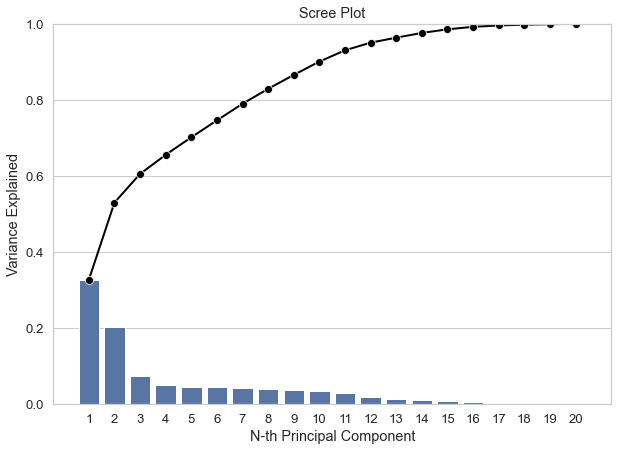

In [13]:
scree_plot(pipeline[1])

Podemos ver que los primeros 10 PC explican el 90% de la variabilidad, y los últimos 8 explican menos del 2% de la variabilidad total cada uno, por lo que podríamos eliminarlos sin una pérdida significativa de información.

In [14]:
def pc_features_relation(pca,variables):
    pca_columns=[]
    for i in range(pca.n_components_):
        pca_columns.append('PC' + str(i+1))

    pcsComponents_df = pd.DataFrame(pca.components_.transpose(), 
                                columns = pca_columns,
                                index = variables
                                )
    return pcsComponents_df


pcsComponents_df = pc_features_relation(pipeline[1],df_pca.columns)
pcsComponents_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20
credit,0.069780,0.313437,0.051573,-0.194615,-0.135536,-0.011427,-0.063919,0.062766,0.020745,-0.347981,-0.840520,0.004379,0.037824,-0.005116,0.005400,0.006053,-0.008916,0.014329,-0.001026,0.002431
age,0.013010,0.067907,-0.035171,-0.965201,0.131842,0.020011,0.037795,-0.040502,-0.003634,0.083033,0.185845,-0.000052,0.000850,-0.006663,-0.001243,-0.004754,0.000286,-0.001362,0.000052,0.001035
hpp Sep 2005,0.160361,-0.300810,-0.004077,-0.044294,-0.088403,0.010623,-0.010361,-0.011895,0.035982,0.565489,-0.321565,-0.608758,-0.242898,0.011869,0.135282,-0.033228,-0.005145,-0.000332,-0.002802,0.000237
hpp Aug 2005,0.193241,-0.337739,0.044682,-0.045093,-0.107884,0.006519,-0.017485,-0.003078,0.022684,0.343608,-0.194339,0.320159,0.560109,-0.059385,-0.485463,0.140151,-0.031224,0.012737,0.003320,-0.000002
hpp Jul 2005,0.199463,-0.347033,0.099677,-0.047251,-0.051315,-0.023884,-0.016868,-0.024327,-0.107018,0.067549,-0.118124,0.541808,-0.100975,-0.163690,0.606277,-0.306475,0.025296,-0.028039,-0.008470,-0.004817
hpp Jun 2005,0.206331,-0.348043,0.136655,-0.053572,-0.005521,-0.044943,0.018645,-0.044296,-0.001457,-0.237243,-0.020386,0.174576,-0.587799,0.062393,-0.225636,0.567741,0.019115,0.001802,0.014053,-0.001424
hpp May 2005,0.210280,-0.335178,0.155542,-0.043100,0.043093,-0.013095,0.015920,0.085432,0.017791,-0.375640,0.053641,-0.175178,-0.081871,0.146726,-0.385891,-0.674041,0.027037,0.023370,-0.008263,-0.000566
hpp Apr 2005,0.205797,-0.309409,0.153558,-0.034091,0.059376,0.074924,-0.036484,0.032124,0.031555,-0.409516,0.109206,-0.362279,0.499720,0.066501,0.395197,0.318475,-0.043229,-0.012622,0.000158,0.004528
abs Sep 2005,0.334788,0.139942,-0.224208,0.021391,-0.050854,-0.029990,-0.050424,0.004863,0.008271,0.068142,0.032703,0.077701,0.035803,0.549889,0.051352,0.013268,0.414465,-0.432305,-0.183894,-0.317456
abs Aug 2005,0.346225,0.140165,-0.193869,0.033234,0.019596,-0.078866,-0.041205,-0.042245,-0.134283,0.057156,0.038359,0.053410,0.016899,0.370117,0.052439,-0.000900,0.039635,0.343710,0.329477,0.646373


### Interpretacion Componentes Principales

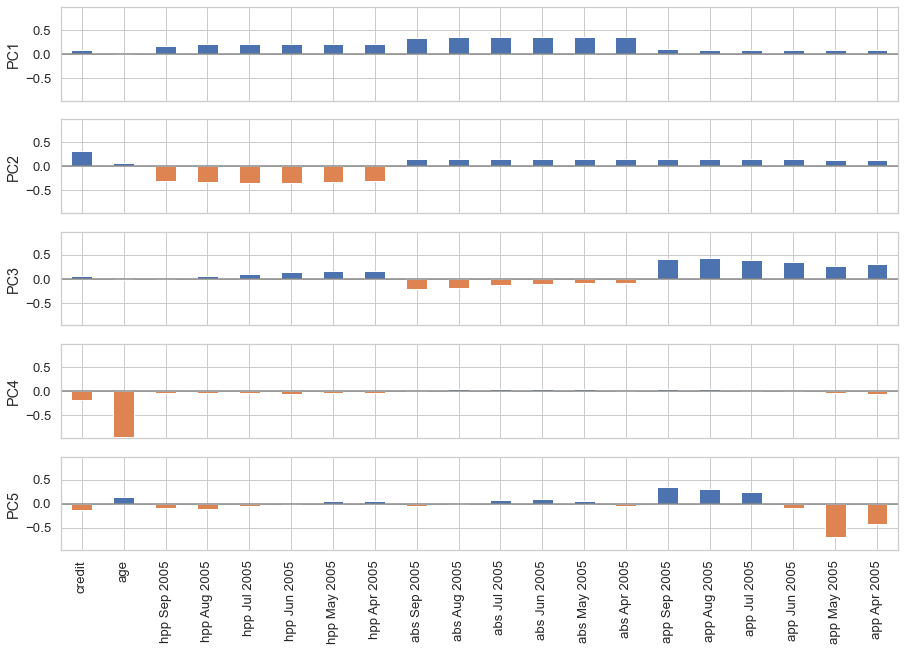

In [15]:
loadings = pd.DataFrame(pipeline[1].components_[0:5, :], columns=df_pca.columns)
maxPC = 1.01 * np.max(np.max(np.abs(loadings.loc[0:5, :])))
f, axes = plt.subplots(5, 1, figsize=(15, 10), sharex=True)
for i, ax in enumerate(axes):
 pc_loadings = loadings.loc[i, :]
 colors = ['C0' if l > 0 else 'C1' for l in pc_loadings]
 ax.axhline(color='#888888')
 pc_loadings.plot.bar(ax=ax, color=colors)
 ax.set_ylabel(f'PC{i+1}')
 ax.set_ylim(-maxPC, maxPC)


El primer componente principal está siendo más afectado por el valor de las facturas en cada uno de los meses

El segundo componente es un contraste entre el valor del crédito y la historia de pago

El tercer componente principal está afectado principalmente por la cantidad del pago anterior en cada uno de los meses

El cuarto componente principal representa principalmente a la edad de cada cliente

El quinto componente es un contraste entre los pagos en los primeros meses y los pagos en los últimos meses


**¿Cuál es el número de componentes mínimo y por qué?**

Da manera inicial seleccionaría los primeros 10 componentes porque representan más del 90% de la variabilidad del data set. Sin embargo, la mejor forma de responder esta pregunta sería en la etapa de modelación realizando Cross Validation para determinar a partir de qué número de componentes el modelo no presenta una mejora significativa.


**¿Cuál es la variación de los datos que representan esos componentes?**

Representan un 90% del total de la variación.


**¿Cuál es la pérdida de información después de realizar PCA?**

Al seleccionar los primeros 10 componentes estaríamos perdieron el 10% de la información en nuestras variables numéricas.


**De las variables originales, ¿Cuál tiene mayor y cuál tiene menor importancia en los componentes principales?**

La variable que tiene mayor importancia en los componentes principales es Amount of bill statement, dado que es la de mayor importancia en el primer componente.


**¿Cuándo se recomienda realizar un PCA y qué beneficios ofrece para Machine Learning?**

Se recomienda realizar PCA siempre que se tenga variables con alta correlación o covarianza, dado que algunos métodos de ML exigen que las variables predictoras sean independientes. Los beneficios principales son:

- la reducción de dimensionalidad, lo cual es importante para el performance computacional de los modelos
- ayuda al cumplimiento de los supuestos de independencia en algunos modelos
- permite lograr interpretabilidad de relaciones e importancia de las variables.

 